# Assigment 1 | Applied Machine Learning | Paras Ahuja

## Question 1

**Define each of the following machine learning terms:**
* **Dataset:** dataset is the name given to a collection of examples that we use to create, and subsequently test our model. Furthermore, each example may contain many elements or attributes. Consider a data of diabetics. In this data we may have person's name, age, blood sugar, weight, diet, and other lifestyle choices. Having a collection of these examples becomes our dataset, and these elements are a part of an example, which is a part of a dataset. We can say that a dataset takes a matrix form, and has rows and columns.


* **Training, Testing, Validation dataset:** training refers to the act of using the collected data, and passing it to a model/algorithm to teach it some key information that may not be easily discernible to a human being. Once we have trained our algorithm, we then test it by passing it the data that has not been seen by the algorithm before. Validation dataset is generally a smaller chunk of the bigger dataset. Validation dataset is not passed to the algorithm for training purposes, however it is kept separate. Once the training phase is complete, we then pass the algorithm a validation dataset to test its assumptions.


* **Ground truth, Label:** ground truth, and label can be treated as interchangeable terms. These terms refer to the "reality" of the situation. Using the diabetic dataset example, if the ground truth/label/reality is that given certain characteristics, a person is considered to be a diabetic, then this is the ground truth, and this will be the label of our dataset when it is passed to the algorithm. 


* **Pre-processing, Feature, Numerical, Nominal:** pre-processing refers to the act of obtaining and organizing the data in a way that allows us to train our algorithm. This could involve obtaining the data and removing any missing instances, or standard scaling the data. In some instances changing a class from alphabetical to numerical. In our diabetic example above, if the class is stated as diabetic/non-diabetic, this can be changed to 1/0. Feature refers to an attribute or a particular column of a dataset. Data comes in all size, shapes, and types. Numerical refers to data that is numerical format - data that is measured in numbers. Nominal on the other hand refers to data that just happens to utilize numbers but cannot be measured in numbers. For instance, if we have three 3 classes (Setosa, Virginica, and Versicolor), and during preprocessing we change these classes to 1, 2, and 3 respectively, the data is now nominal, we cannot take average of this data because it will make no sense.


* **Model validation, Accuracy, Cross-validation:** Model validation refers to act of validating the model that we have created. This can involve many smaller tasks like passing the validation dataset to the model, making sure that the data is in the format that is understood by the model. Accuracy refers to how accurate is the model. We trained our model, we tested it, how accurate was the model in correctly classifying the data or understanding the ground truth. Lastly, cross-validation is one of the model validation techniques used in machine learning, and data science. "In cross-validation, we further divide a dataset into training and validation subsets in order to estimate the generalization performance of the model." Excerpt From: Sebastian Raschka & Vahid Mirjalili. "Third Edition."

## Question 2

**Pick two of the Scikit-learn datasets which are already included in the library (i.e. the ones with datasets_load_)  and find out the following:**

In [1]:
import pandas as pd
import numpy as np
import sklearn as sk
from sklearn import cluster
from sklearn import datasets, metrics, naive_bayes, tree
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 200

In [2]:
cancer = datasets.load_breast_cancer(as_frame=True)
wine = datasets.load_wine(as_frame=True)

In [3]:
cancer_frame = cancer.frame
wine_frame = wine.frame

In [4]:
cancer_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [5]:
wine_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   alcohol                       178 non-null    float64
 1   malic_acid                    178 non-null    float64
 2   ash                           178 non-null    float64
 3   alcalinity_of_ash             178 non-null    float64
 4   magnesium                     178 non-null    float64
 5   total_phenols                 178 non-null    float64
 6   flavanoids                    178 non-null    float64
 7   nonflavanoid_phenols          178 non-null    float64
 8   proanthocyanins               178 non-null    float64
 9   color_intensity               178 non-null    float64
 10  hue                           178 non-null    float64
 11  od280/od315_of_diluted_wines  178 non-null    float64
 12  proline                       178 non-null    float64
 13  targe

**The number of data points**

Two datasets I chose for this assignment are breast cancer dataset, and wine dataset. For the breast cancer dataset we notice that there are 569 instances or data points; for the wine dataset we notice that there are 178 instances or data points.

**The number of features and their types**

As we see above we have 31 features for the breast cancer dataset and 14 for the wine dataset. Furthermore, both datasets have features that are float64 type except for the target variable in either dataset - this variable is int64 type.

**The number and name of categories (i.e. the target field)**

In [6]:
cancer_frame["target"].unique()

array([0, 1])

We notice that we have two labels for the cancer dataset. These labels are 0, and 1.

In [7]:
cancer_frame.loc[cancer_frame["target"]==1].shape[0]

357

We also see that there are a total of 357 instances where the target variable is 1. This means that approximately 62% of the data has a target variable as 1. Lastly, since we have 569 total entries, we can simply subtract the number of variables that are 1 from the size of the dataset. This gives us 212 instances of target variable as 0.

In [8]:
wine_frame["target"].unique()

array([0, 1, 2])

We notice that we have three labels for the wine dataset. These labels are 0, 1, and 2.

In [9]:
wine_frame.loc[wine_frame["target"]==0].shape[0]

59

In [10]:
wine_frame.loc[wine_frame["target"]==1].shape[0]

71

We also see that there are a total of 59 instances where the target variable is 0, and 71 instances where the target variable is 1. Lastly, since we have 178 total entries, we can simply subtract the number of variables we already know about from the size of the dataset. This gives us 48 instances of target variable 2.

**The mean (or mode if nominal) of the first two features**

In [11]:
cancer_frame.iloc[:, 0:2].mean()

mean radius     14.127292
mean texture    19.289649
dtype: float64

In [12]:
wine_frame.iloc[:, 0:2].mean()

alcohol       13.000618
malic_acid     2.336348
dtype: float64

We notice here that the mean of mean radius feature, which belongs to the breast cancer dataset is 14.12, and mean texture is 19.28. Lastly, for wine dataset we have alcohol, and malic_acid features, for these features we have a mean of 13.00, and 2.33 respectively.

## Question 3

**Use the following code piece to display feature pairs**

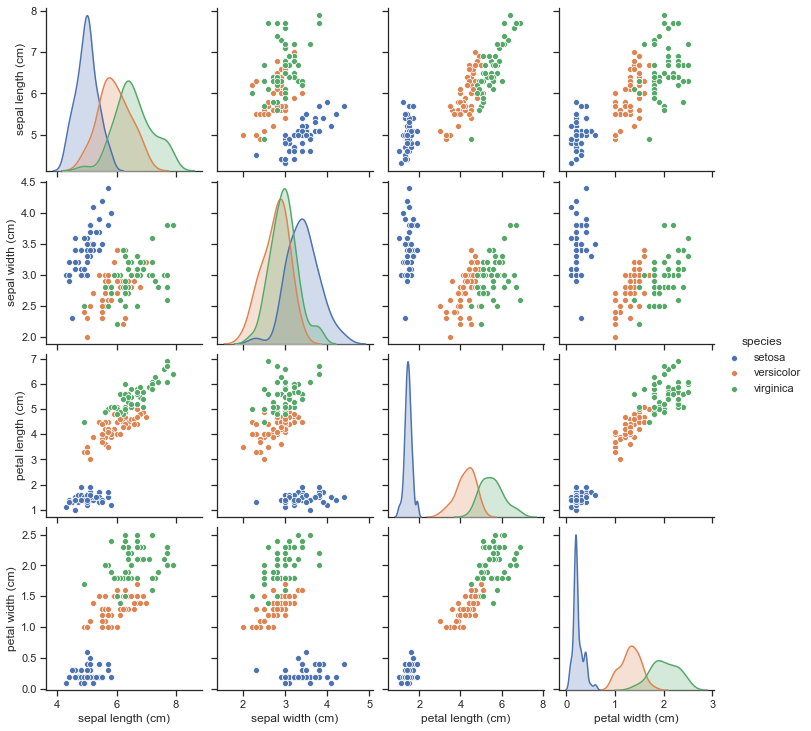

In [13]:
iris = datasets.load_iris() 
iris_df = pd.DataFrame(data= np.c_[iris.data, [iris.target_names[v] for v in iris.target]], columns= iris.feature_names + ['species']) 
cols = iris_df.columns.drop('species') 
iris_df[cols] = iris_df[cols].apply(pd.to_numeric) 
g = sns.pairplot(iris_df, hue='species') 

We notice that nearly in every plot, setosa has been separated from the rest, however versicolor and virginica do not seem linearly separable. If we are looking to separate every class into its own cluster, then this might be a difficult task because the three classes do not seem entirely separable. If we look at petal length as the x-axis and sepal width as the y-axis we notice that there is separation between setosa (it has been bunched in one corner) and the remaining to species have some sort of a merger. We notice this again with petal width as the x-axis. Nearly every plot shows separation. However, the separation is more pronounced whenever we have petal length, and petal width either on the x or the y axis. 

Also note that the diagonals are the distributions of x-axis vs the class. So we can see that the best separation is attained with petal width, and petal length.

---
>**NOTE:** I had to split the dataset features because the plots were too small. I tried switching the wine dataset to another dataset but other classification datasets have higher dimensionality. For this reason I kept the wine dataset, and breast cancer dataset. All other datasets generated warning, and even when I suppressed the warnings, it took significant amount of time to plot, and the plots were even smaller.
---

### Wine Dataset

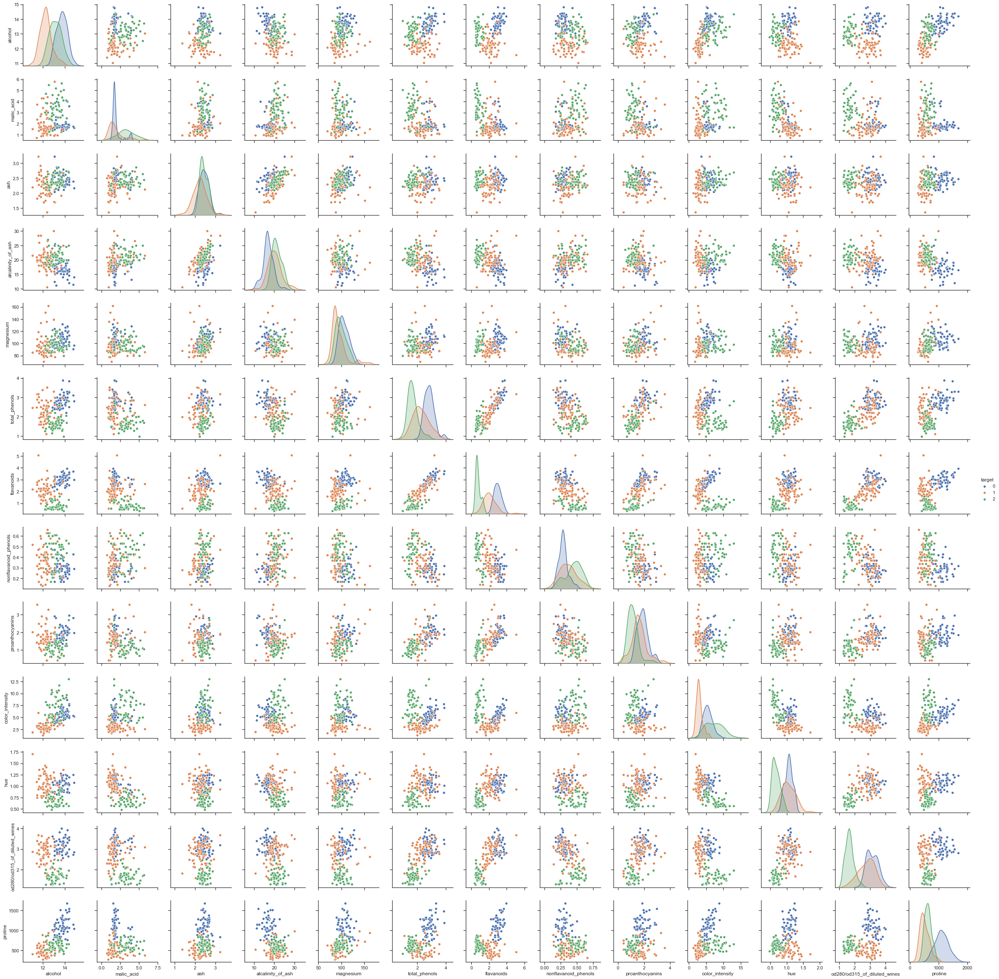

In [14]:
cols = wine_frame.columns.drop('target')
wine_frame[cols] = wine_frame[cols].apply(pd.to_numeric)
g = sns.pairplot(wine_frame, hue='target') 

We notice that the plots are quite small. But even through the small plots we can see that proline is definitely a variable we should consider in our analysis. We can further analyze the graphs section-by-section but we will miss out on some information because we are only looking at the small number of variables at a time. 

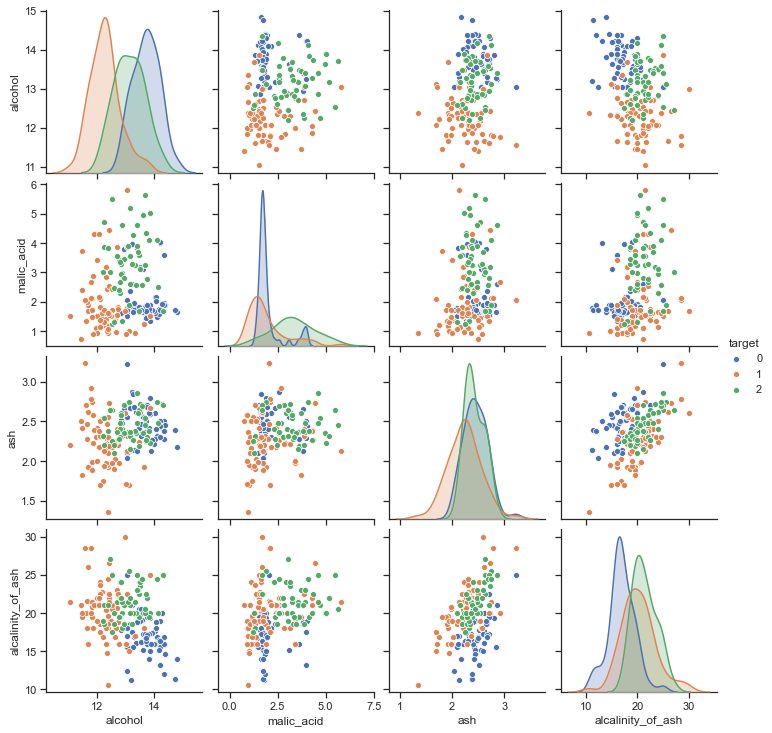

In [15]:
cols = wine_frame.columns.drop('target')
wine_frame[cols] = wine_frame[cols].apply(pd.to_numeric)
target = wine_frame['target']
wine_frame = wine_frame.drop(columns='target')
wine_frame.insert(4, 'target', target)
g = sns.pairplot(wine_frame.iloc[:, 0:5], hue='target') 

We notice here that the first four variables are not linearly separable and are quite intertwined. However, (alcohol, alcalinity_of_ash) and (alcalinity_of_ash, alcohol) provide the most differentiation - at least on the surface level.

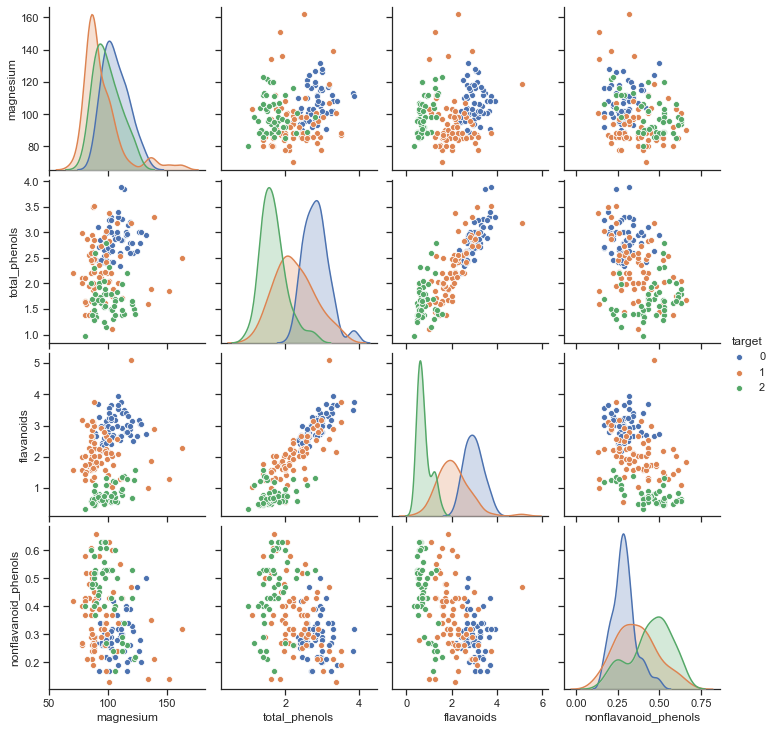

In [16]:
target = wine_frame['target']
wine_frame = wine_frame.drop(columns='target')
wine_frame.insert(8, 'target', target)
g = sns.pairplot(wine_frame.iloc[:, 4:9], hue='target') 

Here again we notice the same situation as we did above, the variables are quite intertwined. We notice that flavanoids, nonflavanoid_phenols, and total_phenols provide the most discernibility.

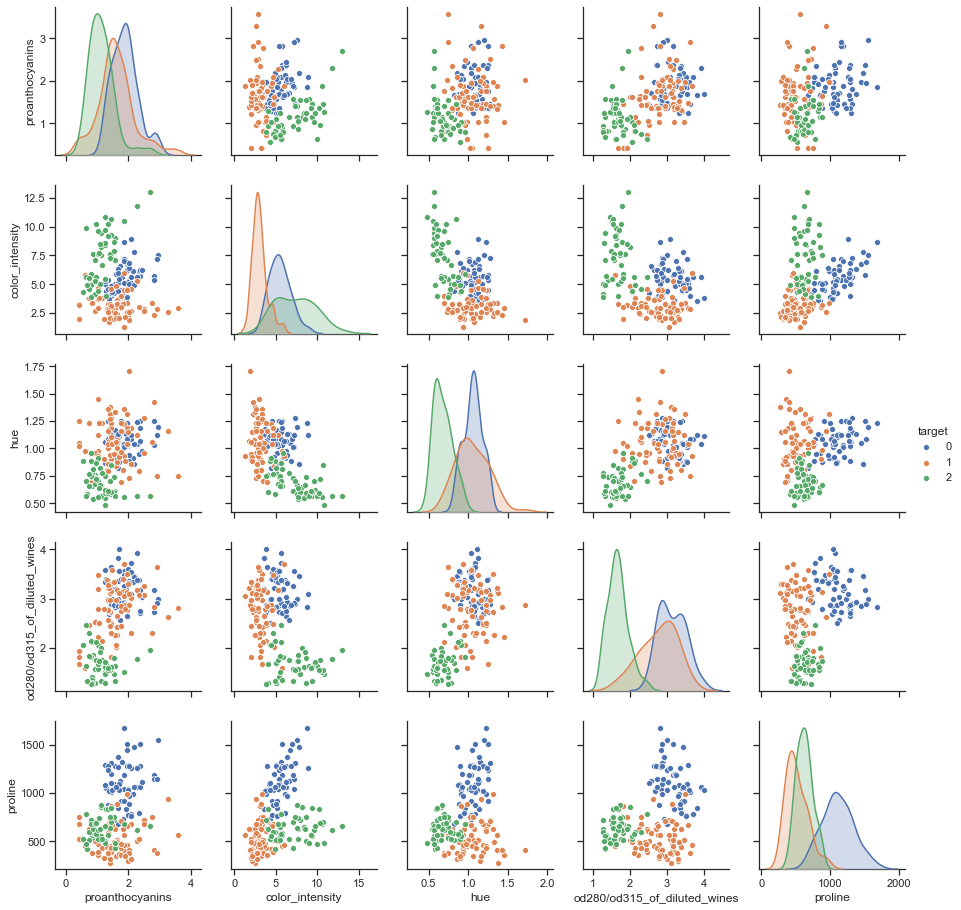

In [17]:
target = wine_frame['target']
wine_frame = wine_frame.drop(columns='target')
wine_frame.insert(13, 'target', target)
g = sns.pairplot(wine_frame.iloc[:, 8:], hue='target') 

We notice that proline on the x-axis, while having others on the y-axis certainly provides a clearer picture. Therefore, our earlier analysis is correct.

### Digits Dataset

In [18]:
digits = datasets.load_digits(as_frame=True)
digits_frame = digits.frame

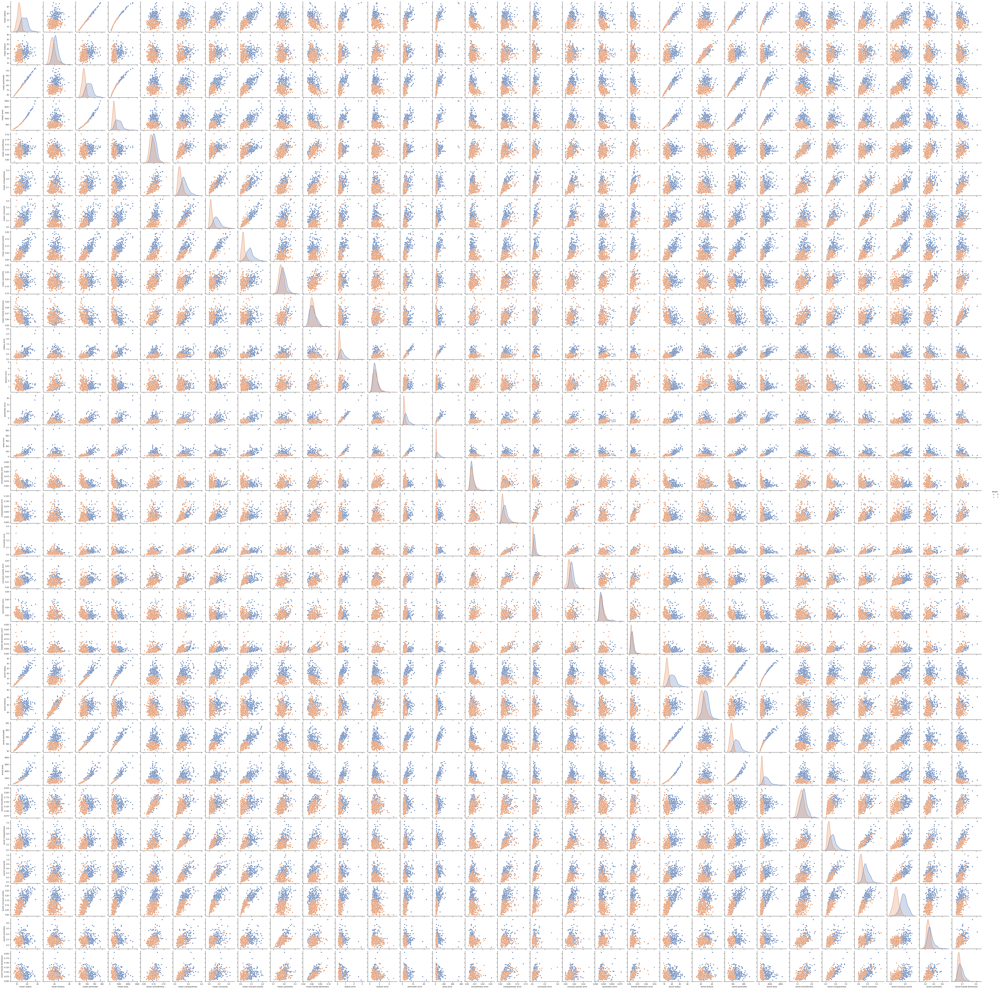

In [19]:
cols = cancer_frame.columns.drop('target') 
cancer_frame[cols] = cancer_frame[cols].apply(pd.to_numeric) 
g = sns.pairplot(cancer_frame, hue='target')

Again we notice that due to high dimensionality the plots are quite small. However, we can still make out that some variables are a better indicator of cancer than others. There are some combination of variables that work well. For instance, if plot (mean texture, concave plot error) this is very difficult to discern. While there is still some separation, this is not the best. If we look at worst concave point, we see more clear separation. Same thing with worst area. Following are the variables that can be considered: mean radius, mean perimeter, mean area, mean concavity, mean concave points, worst concave points, worst perimeter, and worst radius. Below we look at a small number of features at a time.

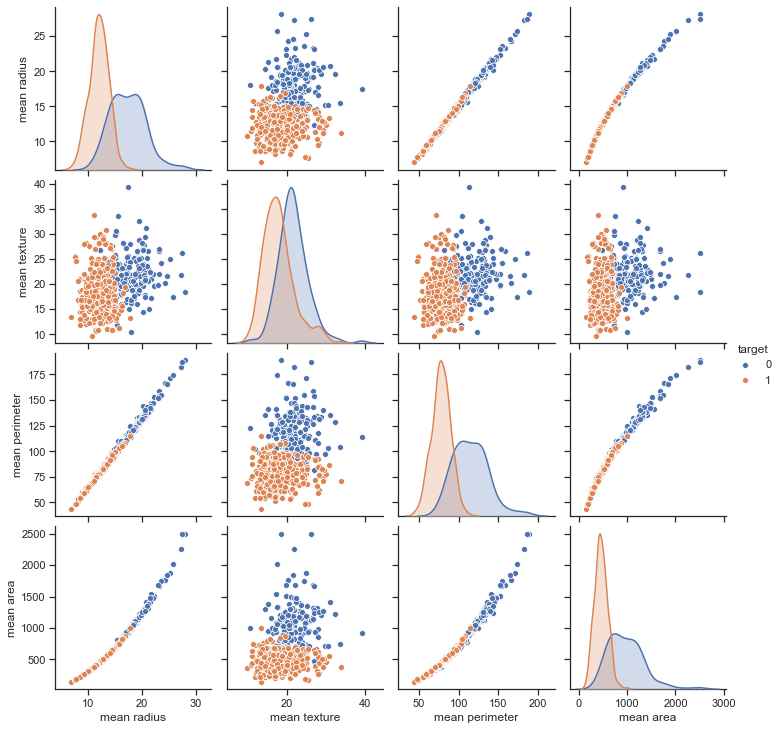

In [20]:
target = cancer_frame['target']
cancer_frame = cancer_frame.drop(columns='target')
cancer_frame.insert(4, 'target', target)
g = sns.pairplot(cancer_frame.iloc[:, 0:5], hue='target') 

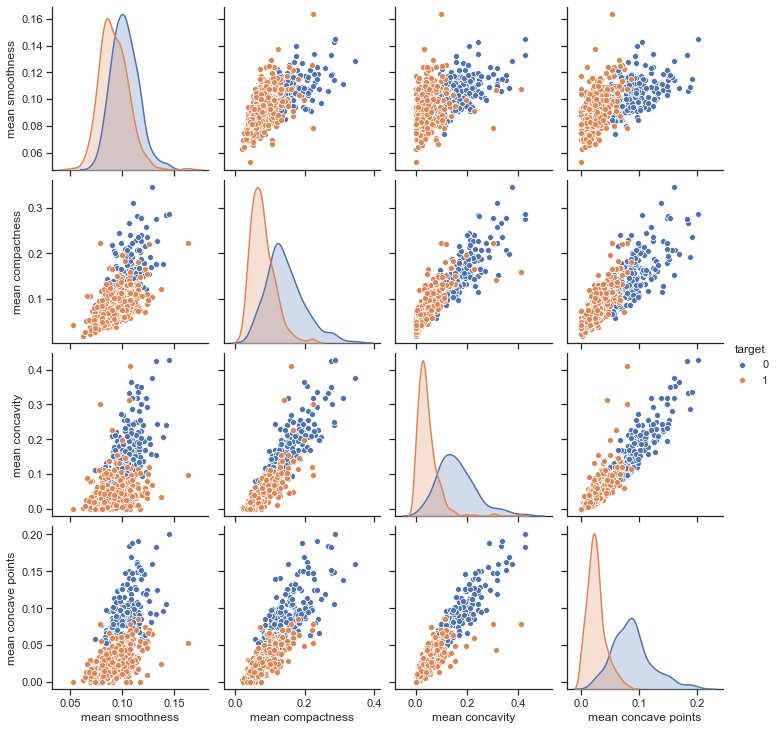

In [21]:
target = cancer_frame['target']
cancer_frame = cancer_frame.drop(columns='target')
cancer_frame.insert(8, 'target', target)
g = sns.pairplot(cancer_frame.iloc[:, 4:9], hue='target') 

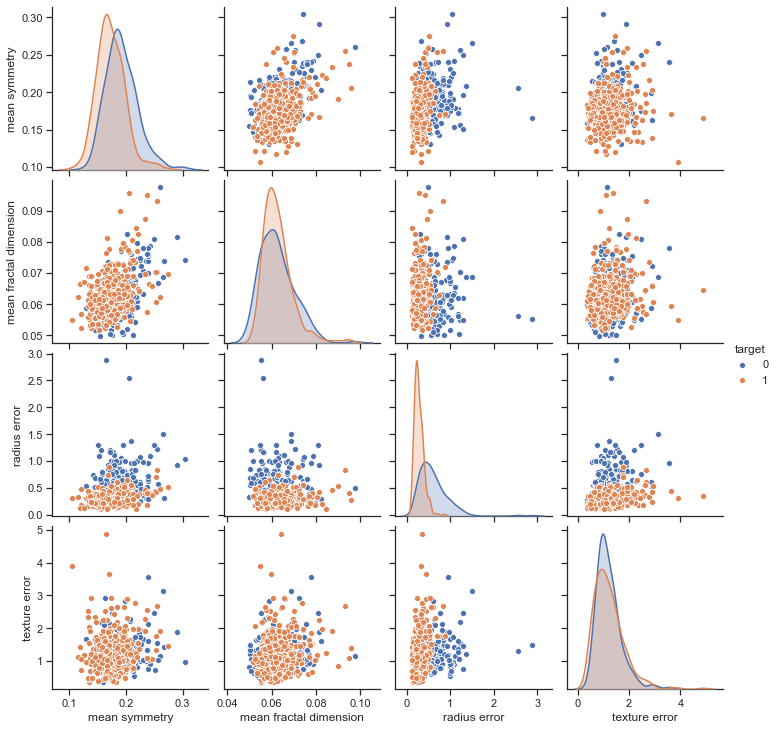

In [22]:
target = cancer_frame['target']
cancer_frame = cancer_frame.drop(columns='target')
cancer_frame.insert(12, 'target', target)
g = sns.pairplot(cancer_frame.iloc[:, 8:13], hue='target') 

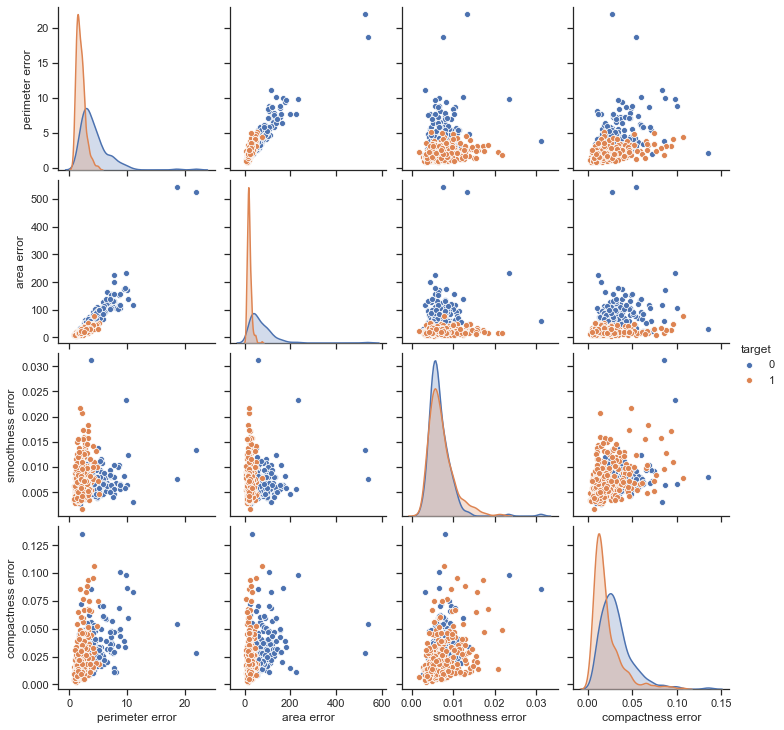

In [23]:
target = cancer_frame['target']
cancer_frame = cancer_frame.drop(columns='target')
cancer_frame.insert(16, 'target', target)
g = sns.pairplot(cancer_frame.iloc[:, 12:17], hue='target') 

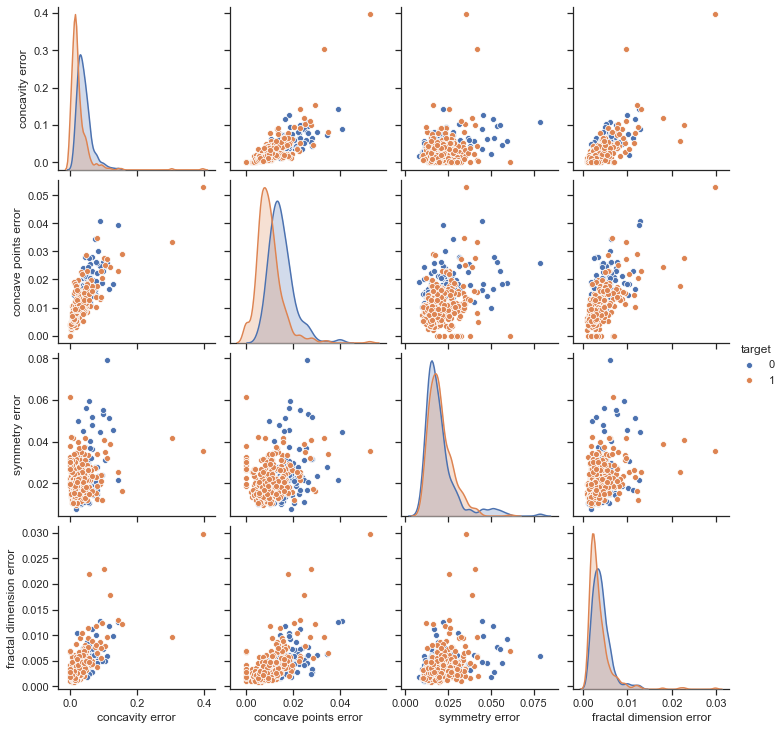

In [24]:
target = cancer_frame['target']
cancer_frame = cancer_frame.drop(columns='target')
cancer_frame.insert(20, 'target', target)
g = sns.pairplot(cancer_frame.iloc[:, 16:21], hue='target') 

As we noticed earlier, these errors do not tell us much. It is very hard to tell malignant cancer from benign cancer based on this information. This is possibly the noise in our dataset, and perhaps we can employ dimensionality reduction here as these variables are not adding much to our model.

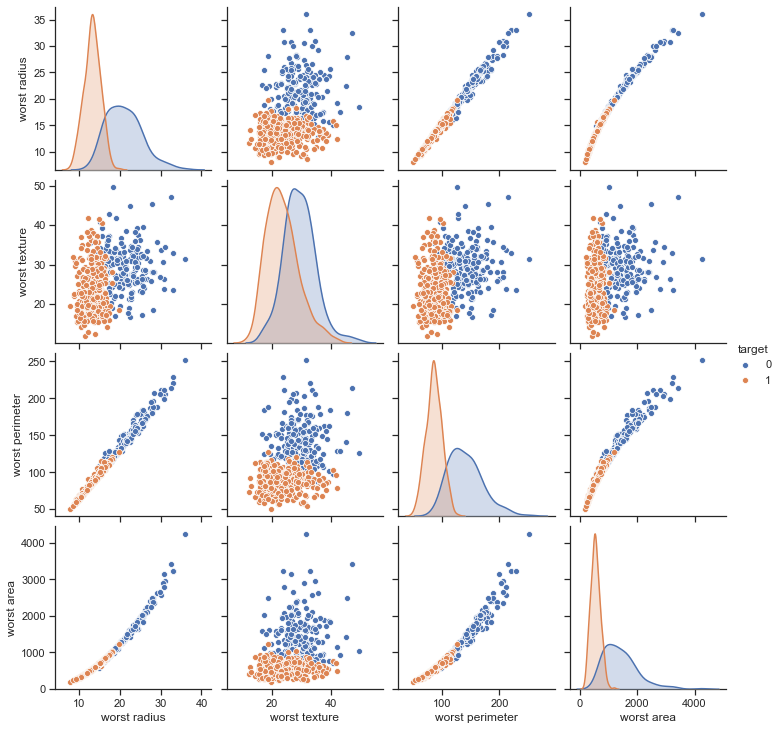

In [25]:
target = cancer_frame['target']
cancer_frame = cancer_frame.drop(columns='target')
cancer_frame.insert(24, 'target', target)
g = sns.pairplot(cancer_frame.iloc[:, 20:25], hue='target') 

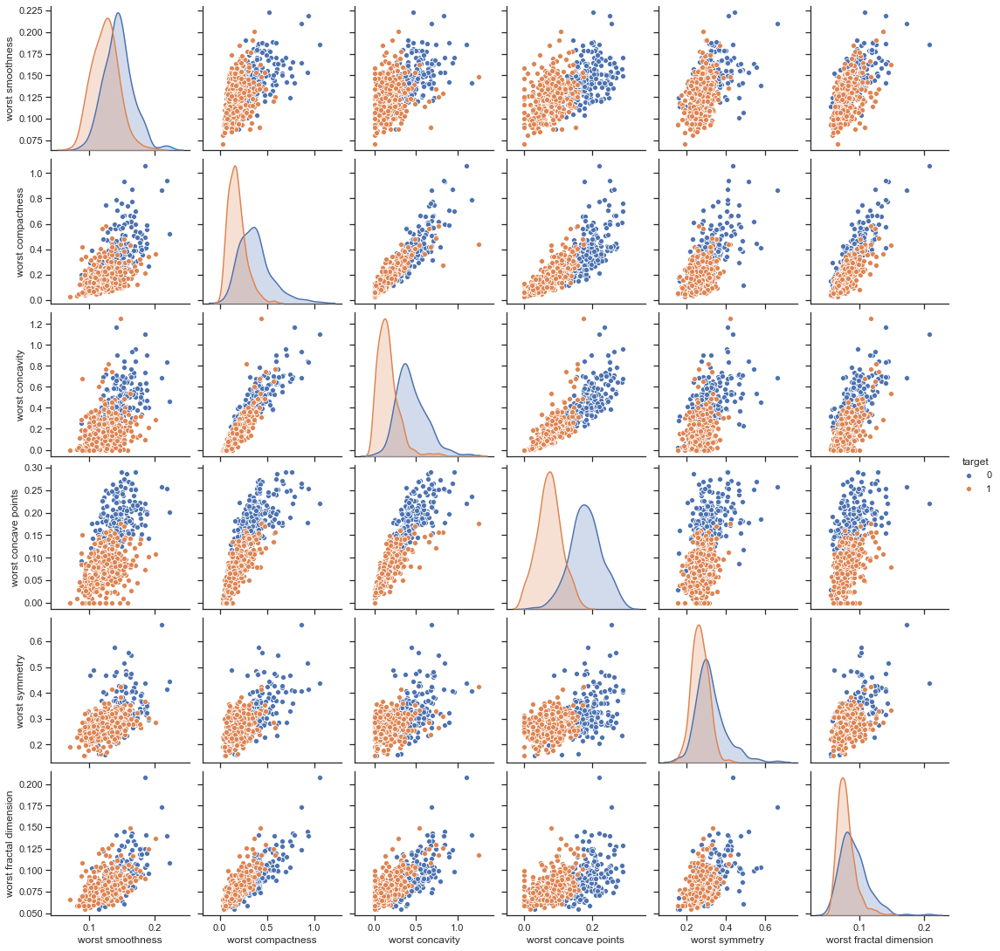

In [26]:
target = cancer_frame['target']
cancer_frame = cancer_frame.drop(columns='target')
cancer_frame.insert(30, 'target', target)
g = sns.pairplot(cancer_frame.iloc[:, 24:], hue='target') 

Here too we notice that worst smoothness, is not adding much, but other variables provide some valuable information. This is exactly what our earlier analysis showed us.

## Question 4

**Refer to the plots in the previous question and discuss an unsupervised approach to group the dataset into non-overlapping clusters. Answer the following questions:**

There are many unsupervised learning techniques. In unsupervised learning our data is not labeled, we do not have direct feedback, and the goal is to find hidden structure in the data. K-means clustering is one approach we can utilize to create clusters. "The K-means algorithm in data mining starts with a first group of randomly selected centroids, which are used as the beginning points for every cluster, and then performs iterative (repetitive) calculations to optimize the positions of the centroids." 

Reference: https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1

**Which features would you use?**

From the breast cancer dataset I would definitely use mean radius, mean perimeter, mean area, mean concavity, mean concave points, worst concave points, worst perimeter, and worst radius to name a few. From the diabetes dataset I would use alcohol, alcalinity_of_ash, flavanoids, nonflavanoid_phenols, and total_phenols as these variables provide the most discernibility, and should relatively easily form in clusters.

---
>**NOTE:** For the next question I originally used K-means clustering technique but the assignment document does not mention it, and I did not want to jump 
---

**Are three clusters obvious? Roughly mark them on a few plots.**

Three clusters are not possible. Virginica, and Versicolor will get clustered together. We even see this fact in the graph above where we have Setosa in one corner, and the other two are bunched together and in some cases overlapping/bordering the other class.

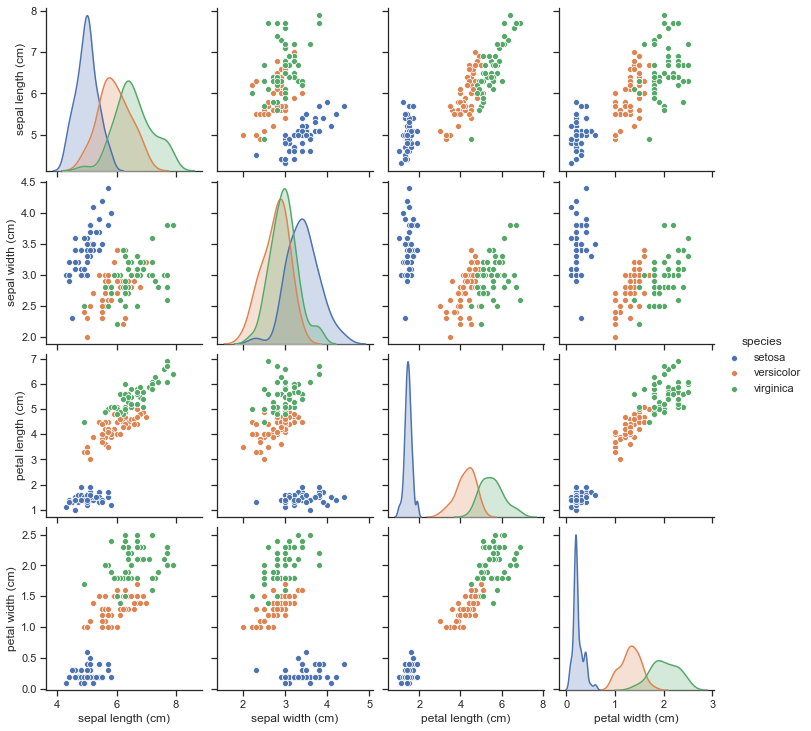

In [27]:
iris = datasets.load_iris() 
iris_df = pd.DataFrame(data= np.c_[iris.data, [iris.target_names[v] for v in iris.target]], columns= iris.feature_names + ['species']) 
cols = iris_df.columns.drop('species') 
iris_df[cols] = iris_df[cols].apply(pd.to_numeric) 
g = sns.pairplot(iris_df, hue='species') 

With the help of the code above, we notice that the 3 clusters are not really possible here. Again, setosa is in its own corner while the other two species are encroaching boundaries. This will make it really difficult for clear separate clusters to be formed. 

**For this problem, is there any relation between classification and clustering since the labels are already given?**



In classification we use predefined classes or ground truth. In clustering we identify similarities between group. In clustering we are interested in finding certain characteristics, and finding out which groups share these characteristics, and which do not. That being said, setosa will be clearly identified and will be differentiated, while versicolour, and virginica may get clustered together because of certain shared characteristics. It will also be interesting to study this similarity, and to get rid of it in the over all analysis if getting rid of it does not lead to bias in one way or another.

## Question 5

**Using the scikit-learn class descriptions for Naive Bayes and decision trees, classify the Iris dataset in question 3. Your code should be very similar to that in the Module 1 Jupyter notebook. In cell 5 the dataset is divided into two portions, one for training the other for testing. Make sure you use the same input data for the Naive Bayes classifier and decision tree classifier.**

### Get the dataset

In [28]:
# Standard scientific Python imports
%matplotlib inline
import matplotlib.pyplot as plt

In [29]:
# Load iris dataset for training
iris = datasets.load_iris()

# Zip the data and target (dependent variable) together. We can do this two ways for this dataset.
data_and_target = list(zip(iris.data, iris.target))
data_and_target_names = list(zip(iris.data, iris.target_names))

We need to find out some information about the iris dataset to know what we are working with. This is important because it will help us facilitate our analysis. Furthermore, we need to know if we are dealing with any missing data. If we information is missing we will need to devise a plan to address this issue. We begin by finding out how many instances are there in the iris dataset.

In [30]:
print(f'Number of instances in the iris dataset, N= {len(iris.data)}')

Number of instances in the iris dataset, N= 150


The dataset has 150 instances, which means we have 150 examples to work with. Next we need to find out the computer representation of this dataset. For this we can view the first few rows of the dataset and it should give us a good idea of what the computer sees.

In [31]:
data_and_target_names[0:3]

[(array([5.1, 3.5, 1.4, 0.2]), 'setosa'),
 (array([4.9, 3. , 1.4, 0.2]), 'versicolor'),
 (array([4.7, 3.2, 1.3, 0.2]), 'virginica')]

We notice that we are working with a 2D array. We have an array of array here, and it appears this way because we zipped the data, and the target. However, the important point to note is that the attributes appear to be in a floating point number, and target is a string. Another important point to note is that if we chose to zip iris.target, we will have an integer representation of the target instead of string. This is shown below:

In [32]:
data_and_target[0:5]

[(array([5.1, 3.5, 1.4, 0.2]), 0),
 (array([4.9, 3. , 1.4, 0.2]), 0),
 (array([4.7, 3.2, 1.3, 0.2]), 0),
 (array([4.6, 3.1, 1.5, 0.2]), 0),
 (array([5. , 3.6, 1.4, 0.2]), 0)]

In [33]:
# Check the size of the data vectors, examine the indices
print(len(data_and_target))
print(len(data_and_target[0]))
print(len(data_and_target[0][0]))

150
2
4


### Pre-process the dataset

---
>**NOTE:** I shuffled the iris DataFrame. I did this because if we take a look at the iris dataset, the classes are actually ordered. So if I divide the dataset into two halves as is for testing and training, there is a good chance that test dataset may not contain one of the classes or only have low instances, or on the other hand training dataset will not see a class. Therefore, I shuffled it, and provided a random seed. I also experimented with different random seeds, some yielded 100% accuracy as the training dataset size increased, and some provided poor accuracy. I settled on a number that I believed worked best, and was middle of the road. I would have preferred to use k-fold cross validation and stratification, however there is no mention of it in the assignment document therefore I chose this approach, which somewhat matches the one shown in the module 1 notebook.
---

In this step we organize our data in a format that will facilitate analysis. First, we find out if there is anything missing. There is one easy way to do this if we don't already know if something is missing. We can simply force it NaN  because if a value is missing, we will either have a blank, or some other symbol indicating missing information. If it is already NaN, then there is no harm done (except for an added step if there are NaNs). We begin by converting the iris dataset to Pandas DataFrame for easy analysis.

In [34]:
iris_df = pd.DataFrame(data= np.c_[iris.data, [iris.target_names[v] for v in iris.target]], columns= iris.feature_names + ['species']) 

In [35]:
iris_df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


Now that we have our data in a DataFrame, we can simply check for any null values.

In [36]:
iris_df.isnull().values.any()

False

So there are no NaNs in our dataset, however this does not mean that there are no missing values or any special symbols. We have only checked for NaNs.

In [37]:
def force_numeric(df):
    """ This function takes in a Pandas DataFrame as its parameter
        and traverses through the columns coerces each column value
        to numeric. Non-numeric values get converted to NaN.
        This method returns DataFrame.
    """
    for column in df.columns:
        if column != "species":
            df[column] = pd.to_numeric(df[column], errors="coerce")
    return df

In [38]:
iris_df = force_numeric(iris_df)

Before proceeding further, let's shuffle the data so we have a good mix. Iris data appears to be organized by its class so it is a good idea to shuffle anyway. We will also provide random state so that each time the shuffle is the same, it ensures consistency throughout the runs.

In [39]:
iris_df = iris_df.sample(frac=1, random_state=546345)

In [40]:
iris_df.isnull().values.any()

False

We do not have any missing values in the dataset! This is great because the dataset does not have very many instances to begin with and if had any missing values, we might have had to impute those values or remove the example from the dataset - we do not have to do any of this. We can now split the data into training set, and test set. We will start with even split and increase gradually to see if the performance improves as the training data size increases. Because we will need to check if increasing the training dataset size increases performance, we can create a function that does this for us.

In [41]:
def splitter(df, split=0.5):
    """ This function takes in a Pandas DataFrame as its parameter
        and splits the data based on split criteria. If no split
        value is provided default value of 0.5 is used. This
        splits the data evenly in test, and training set.
    """
    n_samples = len(df)
    divide = int(n_samples * split)
    
    X_train = df.iloc[:divide, :len(df.columns)-1]
    Y_train = df.iloc[:divide, -1]
    
    X_test = df.iloc[divide:, :len(df.columns)-1]
    Y_test = df.iloc[divide:, -1]
    X_test.reset_index(drop=True, inplace=True)
    Y_test.reset_index(drop=True, inplace=True)
    
    return X_train, Y_train, X_test, Y_test

In [42]:
X_train, Y_train, X_test, Y_test = splitter(iris_df)

### Naive Bayes

In [43]:
nb_classifier = naive_bayes.CategoricalNB()
nb_classifier.fit(X_train, Y_train)
print("Categorical Naive Bayes Accuracy = {}%".format(np.round(nb_classifier.score(X_test, Y_test), decimals=2)*100))

Categorical Naive Bayes Accuracy = 95.0%


We notice that the accuracy with with Naive Bayes is 95%, however this definitely has to do with the seed provided, other random state seed can and sometimes will provide better accuracy. However, this is the accuracy we have, and we can see if increasing the size of the dataset helps.

### Decision Tree

In [44]:
dt_classifier = tree.DecisionTreeClassifier()
dt_classifier.fit(X_train, Y_train)
print("Decision Tree Classifier Accuracy = {}%".format(np.round(dt_classifier.score(X_test, Y_test), decimals=2)*100))

Decision Tree Classifier Accuracy = 95.0%


We notice that the accuracy with with Decision Tree is 96%, and again we have to keep in mind the seed provided, and different seeds might produce different results because we are shuffling the data.

### Which classifier has the highest performance?

Decision tree classifier provided the highest performance. Naive Bayes' accuracy was 91% whereas Decision Tree Classifier yielded an accuracy of 95%. This is better than Naive Bayes, although the difference is only 4%. In some cases this could mean a lot. For instance, if we are dealing with health data, difference of 4% is certainly meaningful.

### More training helps? Verify by increasing the training dataset size.

In [45]:
def more_training(df, print_info=True):
    """ This function trains the algorithms with different
        trainig dataset sizes by gradually increasing the
        the percentage of the split provided in the splitter
        method. Training dataset split increases in 0.05s.
        Note: 10% data is retained as test data. 
    """
    nb = list()
    dt = list()
    
    split = 0.5
    
    while split < 0.90:
        split += 0.05
        X_train, Y_train, X_test, Y_test = splitter(df, split)
        
        # CategoricalNB
        nb_classifier = naive_bayes.CategoricalNB()
        nb_classifier.fit(X_train, Y_train)
        nb.append((int(split*100), np.round(nb_classifier.score(X_test, Y_test), decimals=2)*100))
        
        # DecisionTreeClassifier
        dt_classifier = tree.DecisionTreeClassifier()
        dt_classifier.fit(X_train, Y_train)
        dt.append((int(split *100), np.round(dt_classifier.score(X_test, Y_test), decimals=2)*100))
    
    if print_info:
        print("Naive Bayes")
        print()
        for i in range(len(nb)):
            print("Increasing training dataset size for Naive Bayes to {}% yields {}% Accuracy".format(nb[i][0], nb[i][1]))

        print()

        print("Decision Tree")
        print()
        for i in range(len(dt)):
            print("Increasing training dataset size for Decision Tree to {}% yields {}% Accuracy".format(dt[i][0], dt[i][1]))
    else:
        return nb, dt

In [46]:
more_training(iris_df)

Naive Bayes

Increasing training dataset size for Naive Bayes to 55% yields 94.0% Accuracy
Increasing training dataset size for Naive Bayes to 60% yields 93.0% Accuracy
Increasing training dataset size for Naive Bayes to 65% yields 92.0% Accuracy
Increasing training dataset size for Naive Bayes to 70% yields 91.0% Accuracy
Increasing training dataset size for Naive Bayes to 75% yields 95.0% Accuracy
Increasing training dataset size for Naive Bayes to 80% yields 93.0% Accuracy
Increasing training dataset size for Naive Bayes to 85% yields 91.0% Accuracy
Increasing training dataset size for Naive Bayes to 90% yields 93.0% Accuracy

Decision Tree

Increasing training dataset size for Decision Tree to 55% yields 94.0% Accuracy
Increasing training dataset size for Decision Tree to 60% yields 93.0% Accuracy
Increasing training dataset size for Decision Tree to 65% yields 94.0% Accuracy
Increasing training dataset size for Decision Tree to 70% yields 91.0% Accuracy
Increasing training dataset

We notice here that more training does help. However, this is not always the case. Sometimes we run into situation where getting more data will not help, and certainly isn't helpful. In this instance, all we had to do is increase the training dataset size, and that was helpful for us. We also notice that Decision tree performs better than Naive Bayes in this instance.

### Will the performance plateau? Show it on a plot.

In [47]:
nb, dt = more_training(iris_df, print_info=False)

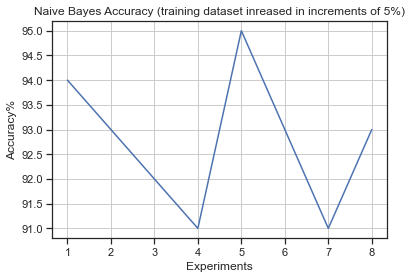

In [48]:
x = np.arange(1, 9, 1)
y = []
for i in range(len(nb)):
    y.append(nb[i][1])

fig, ax = plt.subplots()
ax.plot(x, y)

ax.set(xlabel='Experiments', ylabel='Accuracy%',
       title='Naive Bayes Accuracy (training dataset inreased in increments of 5%)')
ax.grid()
plt.show()

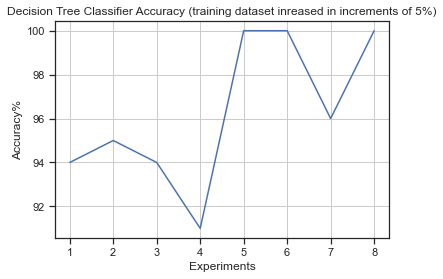

In [49]:
x = np.arange(1, 9, 1)
y = []
for i in range(len(dt)):
    y.append(dt[i][1])

fig, ax = plt.subplots()
ax.plot(x, y)

ax.set(xlabel='Experiments', ylabel='Accuracy%',
       title='Decision Tree Classifier Accuracy (training dataset inreased in increments of 5%)')
ax.grid()
plt.show()

We notice that both of these algorithms plateau. However, Naive Bayes plateau's much faster than Decision Tree Classifier. We notice that with Decision Tree Classifier we attained accuracy of 100% twice, whereas the highest Naive Bayes ever got was 95%. Overall we can say that Decision Tree Classifier performed better.